In [1]:
!pip install -q opendatasets tensorflow_hub
import opendatasets as od

import os
import datetime
import time

from matplotlib import pyplot as plt
from matplotlib import gridspec
import numpy as np

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model, Sequential, backend as K
from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Conv2DTranspose, Dropout, ReLU, Input, Concatenate, concatenate
from tqdm import tqdm

gpus = tf.config.list_physical_devices('GPU')
print("GPU available: ", gpus)

GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [3]:
# od.download("https://www.kaggle.com/ktaebum/anime-sketch-colorization-pair")
# !rm -r anime-sketch-colorization-pair/data/data
# !rm -r anime-sketch-colorization-pair/data/colorgram

In [4]:
def read_png(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img

In [5]:
def split_image(image):
    w = tf.shape(image)[1]
    w = w // 2
    sketch_image = image[:, :w, :]
    colored_image = image[:, w:, :]
    sketch_image = tf.image.resize(sketch_image, (256, 256))
    colored_image = tf.image.resize(colored_image, (256, 256))
    return sketch_image, colored_image

In [6]:
def flip_image(image):
    return tf.image.flip_left_right(image)

def random_jitter(sketch_image, colored_image):

    if tf.random.uniform(()) > 0.5:
        sketch_image = flip_image(sketch_image)
        colored_image = flip_image(colored_image)

    return sketch_image, colored_image

In [7]:
def normalize_symmetric(sketch_image, colored_image):
    sketch_image = tf.cast(sketch_image, tf.float32)/127.5 - 1
    colored_image = tf.cast(colored_image, tf.float32)/127.5 - 1
    return sketch_image, colored_image

def normalize_zero_to_one(sketch_image, colored_image):
    sketch_image = tf.cast(sketch_image, tf.float32)/255
    colored_image = tf.cast(colored_image, tf.float32)/255
    return sketch_image, colored_image

In [8]:
def image_loader(train=False, normalization_fn=normalize_zero_to_one):
    def load_image(image_path):
        image = read_png(image_path)
        colored_image, sketch_image = split_image(image)
        sketch_image, colored_image = normalization_fn(sketch_image, colored_image)
        
        if train:
            sketch_image, colored_image = random_jitter(sketch_image, colored_image)

        return sketch_image, colored_image

    return load_image

In [9]:
def show_n(images, titles=('',)):
    n = len(images)
    image_sizes = [image.shape[1] for image in images]
    w = (image_sizes[0] * 6) // 320
    plt.figure(figsize=(w * n, w))
    gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
    for i in range(n):
        plt.subplot(gs[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(images[i]), aspect='equal')
        plt.axis('off')
        plt.title(titles[i] if len(titles) > i else '')
    plt.show()

In [10]:
train_path = './anime-sketch-colorization-pair/data/train/'
train_images_path = [os.path.join(train_path, image_name) for image_name in os.listdir(train_path)]
print(f'Training samples = {len(train_images_path)}')

test_path = './anime-sketch-colorization-pair/data/val/'
test_images_path = [os.path.join(test_path, image_name) for image_name in os.listdir(test_path)]
print(f'Test samples = {len(test_images_path)}')

Training samples = 14224
Test samples = 3545


In [11]:
BATCH_SIZE = 32
BUFFER_SIZE = 400

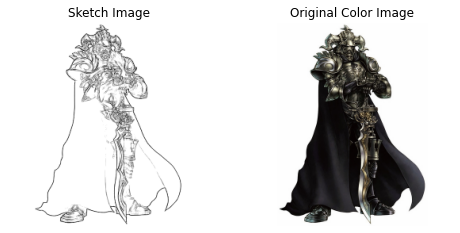

In [12]:
BATCH_SIZE = 32
BUFFER_SIZE = 400

train_dataset = tf.data.Dataset.from_tensor_slices(train_images_path)
train_dataset = train_dataset.map(image_loader(train=True, normalization_fn=normalize_symmetric), num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

for sketches, colors in train_dataset.take(1):
    show_n([sketches[0], colors[0]], titles=['Sketch Image', 'Original Color Image'])

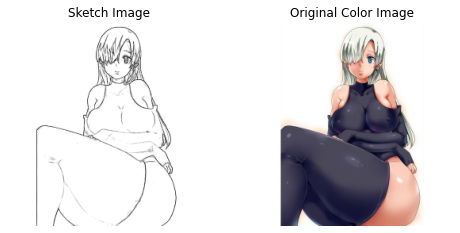

In [13]:
test_dataset = tf.data.Dataset.from_tensor_slices(test_images_path)
test_dataset = test_dataset.map(image_loader(train=False, normalization_fn=normalize_symmetric))
test_dataset = test_dataset.batch(BATCH_SIZE)

for sketches, colors in test_dataset.take(1):
    show_n([sketches[0], colors[0]], titles=['Sketch Image', 'Original Color Image'])

In [14]:
def downsample(filters, size, apply_batchnorm=True):
    block = Sequential()
    block.add(Conv2D(filters, size, strides=2, padding='same', use_bias=False))

    if apply_batchnorm:
        block.add(BatchNormalization())
        
    block.add(LeakyReLU())

    return block

def upsample(filters, size, apply_dropout=False):
    block = Sequential()
    block.add(Conv2DTranspose(filters, size, strides=2, padding='same', use_bias=False))
    block.add(BatchNormalization())

    if apply_dropout:
        block.add(Dropout(0.5))

    block.add(ReLU())

    return block

In [15]:
OUTPUT_CHANNELS = 3

def Unet():
    inp = Input(shape=[256,256,3])
    x = inp
    
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    
    bottleneck = downsample(512, 4)
    # decoder stack
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    last_layer = Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same', activation='tanh')
    
    # Downsampling
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    x = bottleneck(x)
    skips.reverse()

    # Upsampling + creating skip connections for the i-th encoder and (n-i)-th decoder
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last_layer(x)

    model = Model(inputs=inp, outputs=x)
    return model

unet = Unet()

In [16]:
unet_optimizer = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)

In [17]:
def unet_loss(generated, target):
    return tf.keras.metrics.mean_absolute_error(generated, target) * 1000

In [18]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/unet")


checkpoint_path = "./tf_ckpts/unet"
ckpt = tf.train.Checkpoint(unet=unet)

manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

In [19]:
def generate_images(model, test_input, target):
    prediction = model(test_input, training=False)
    show_n([test_input[0], target[0], prediction[0]], titles=['Sketch Image', 'Original Image', 'Generated Image'])

In [20]:
@tf.function
def train_step(sketch_image, ground_truth, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        unet_output = unet(sketch_image, training=True)

        train_loss = unet_loss(unet_output, ground_truth)

    unet_gradients = gen_tape.gradient(train_loss, unet.trainable_variables)
    unet_optimizer.apply_gradients(zip(unet_gradients, unet.trainable_variables))

    return train_loss

In [21]:
epoch_loss_avg_train = tf.keras.metrics.Mean('train_loss')
epoch_loss_avg_test = tf.keras.metrics.Mean('test_loss')

In [22]:
def fit(train_ds, test_ds, epochs):
    start = 0
    ckpt.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("Restored from {}".format(manager.latest_checkpoint))
        start = int(manager.latest_checkpoint.split('-')[-1])
    else:
        print("Initializing from scratch.")
    
    for epoch in range(start + 1, start + epochs + 1):
        for example_input, example_target in test_ds.take(1):
            generate_images(unet, example_input, example_target)
        
            print("Epoch: ", epoch)
        
            start = time.time()
        
            for n, (sketch_image, colored_image) in tqdm(train_ds.enumerate()):
                train_loss = train_step(sketch_image, colored_image, epoch)
                epoch_loss_avg_train(train_loss)
            
            for n, (sketch_image, colored_image) in test_ds.enumerate():
                test_loss = unet_loss(unet.predict(sketch_image, verbose = 0), colored_image)
                epoch_loss_avg_test(test_loss)
            
            print("Train Loss: %.2f" % epoch_loss_avg_train.result().numpy())
            print("Test Loss: %.2f" % epoch_loss_avg_test.result().numpy())
            
            print()
            print(f'Time taken: {time.time()-start:.2f} sec')
            print("=====================================================")
            print()

            start = time.time()

            with summary_writer.as_default():
                tf.summary.scalar('train_loss', epoch_loss_avg_train.result().numpy(), step=epoch)
                tf.summary.scalar('test_loss', epoch_loss_avg_test.result().numpy(), step=epoch)

        
            epoch_loss_avg_train.reset_states()
            epoch_loss_avg_test.reset_states()
          
            saved_path = manager.save()
            print("Saved checkpoint for epoch {}: {}".format(int(epoch), saved_path))
            
            unet.save_weights(f'./generator_weights/unet/epoch-{epoch}')
            
            


In [23]:
fit(train_dataset, test_dataset, 0)

Restored from ./tf_ckpts/unet/ckpt-30


In [24]:
# %reload_ext tensorboard
# %tensorboard --logdir logs

# !kill 250

In [25]:

# !rm -r logs/fit/unet
# !rm -r tf_ckpts/unet
# !rm -r generator_weights/unet

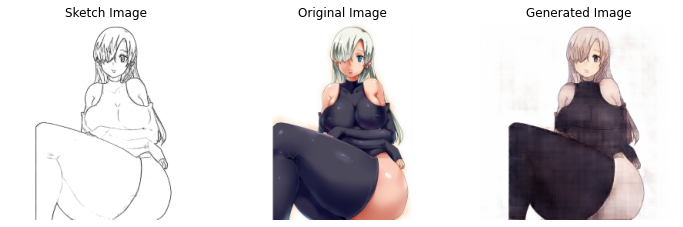

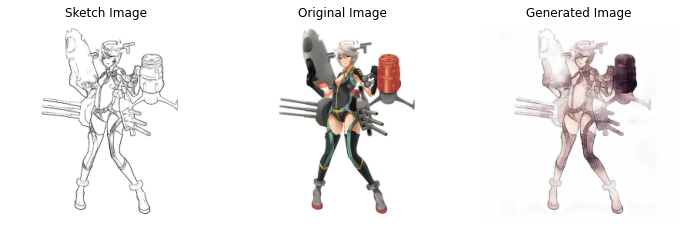

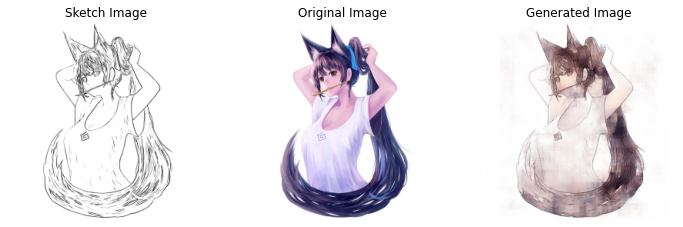

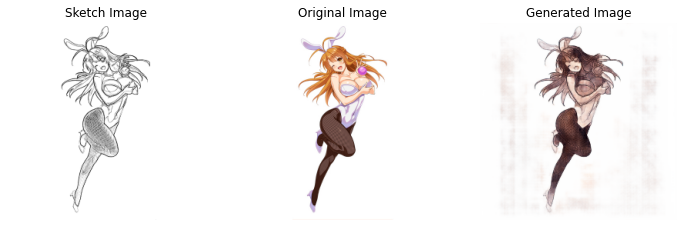

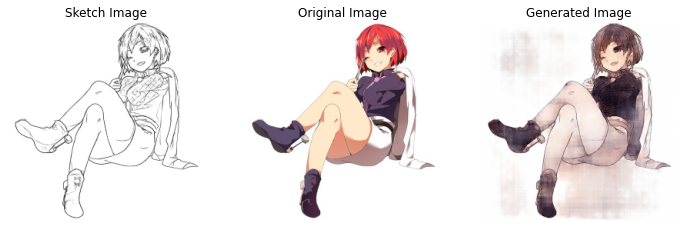

...

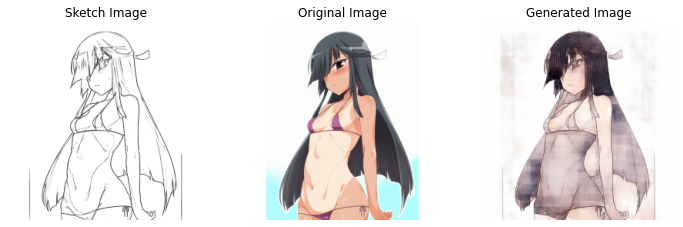

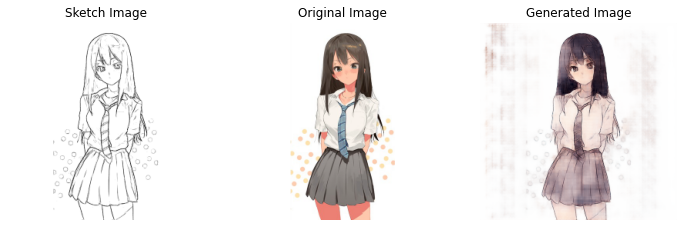

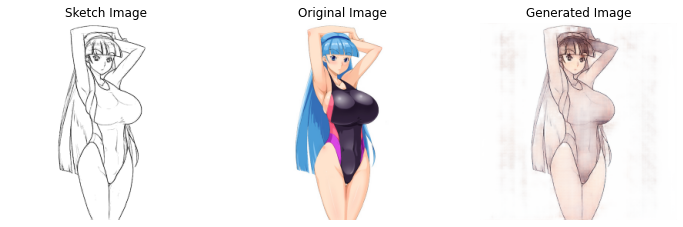

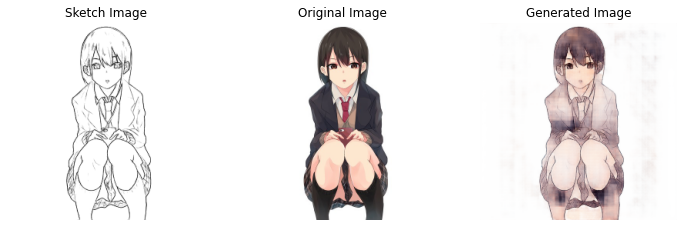

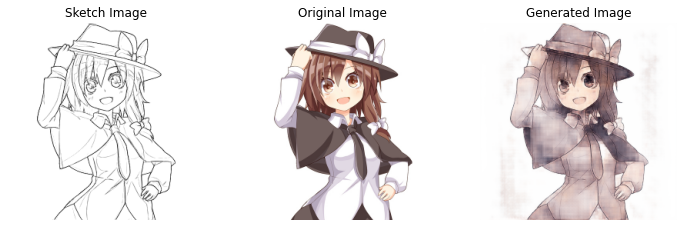

In [26]:
unet.load_weights('./generator_weights/unet/epoch-26')

for example_inputs, example_targets in test_dataset.take(2):
    for i in range(len(example_inputs)):
        generate_images(unet, example_inputs[i:i+1], example_targets[i:i+1])

In [27]:
mae = 0
for i, (sketches, colors) in tqdm(test_dataset.enumerate()):
    generated = unet.predict(sketches, verbose=0)
    loss = tf.reduce_mean(tf.abs(colors - generated))
    mae += loss
print(f'avg mae = {mae / len(test_dataset)}')

100%|██████████| 111/111 [00:40<00:00,  2.71it/s]

avg mae = 0.15376430749893188


avg mae = 0.15376430749893188

In [28]:
ssim = 0
for i, (sketches, colors) in tqdm(test_dataset.enumerate()):
    generated = unet.predict(sketches, verbose=0)
    loss = tf.reduce_mean(tf.image.ssim(generated, colors, 255))
    ssim += loss
print(f'avg ssim = {ssim / len(test_dataset)}')

100%|██████████| 111/111 [00:27<00:00,  4.04it/s]

avg ssim = 0.987454891204834


avg ssim = 0.987454891204834

In [30]:
from scipy import linalg

def calculate_fid(real, generated):
    fid = 0
    num = len(real)
    for index in range(num):
        temp_fid = 0
        for i in range(3):
            # calculate mean and covariance statistics
            mu1, sigma1 = real[index].mean(axis=0), np.cov(real[index][:,:,i], rowvar=False)
            mu2, sigma2 = generated[index].mean(axis=0), np.cov(generated[index][:,:,i], rowvar=False)

            # calculate sum squared difference between means
            ssdiff = np.sum((mu1 - mu2)**2.0)

            # calculate sqrt of product between cov
            covmean = linalg.sqrtm(sigma1.dot(sigma2))

            # check and correct imaginary numbers from sqrt
            if np.iscomplexobj(covmean):
                covmean = covmean.real

            # calculate score
            temp_fid += ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
        fid += temp_fid / 3
    return fid/num

In [32]:
fid = 0
for i, (sketches, colors) in tqdm(test_dataset.enumerate()):
    generated = unet.predict(sketches, verbose=0)
    fid += calculate_fid(colors.numpy(), generated)
print(f'avg fid = {fid / len(test_dataset)}')

100%|██████████| 111/111 [14:08<00:00,  7.65s/it]

avg fid = 31.392449490251195


avg fid = 31.392449490251195